# **ANNUAL WEATHER TYPES: SENSIVILITY ANALYSIS**


In [1]:
import warnings
warnings.filterwarnings('ignore')

# system
import os
import os.path as op

import sys 

## Climate Indexes

In [ ]:
from utils.codes import nao_format, ao_format, amo_format, scand_format, plot_index

In [ ]:
p_index = 'inputs/Index_Data'

In [40]:
n_pcs = 50

pcs = dwt_ob.pca_ob.pca.isel(n_components = range(n_pcs))

In [41]:
pcs = xr.Dataset({'PCs': (['time','n_pcs'],pcs.PCs.values[:,0:n_pcs])},
                     coords={'time': xds_SST.time.values, 'n_pcs': range(n_pcs)})

## NAO

In [42]:
nao_p=np.loadtxt(op.join(p_index, 'nao.txt'),skiprows=2,usecols=np.arange(0,13))
nao=nao_format(nao_p, rolling_mean=0, rol_months=1)
# nao = nao.resample(time = '1y').mean()

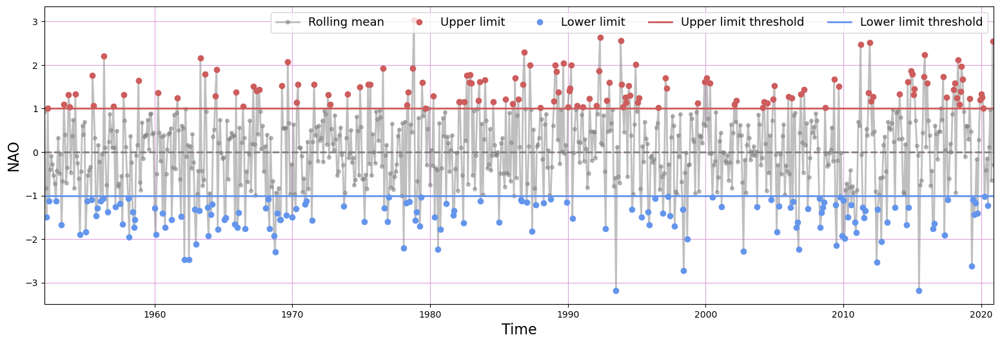

In [43]:
thr1=1
thr2=-1
nao = plot_index(nao, name='NAO', l1=thr1, l2=thr2, figsize=[19,6])

In [44]:
u = np.intersect1d(pcs.time.values, nao.time.values)
pcs_nao = pcs.sel(time = u)
pcs_nao['nao'] = (('time'), nao.sel(time = u).index.values)

In [45]:
# fig, ax = plt.subplots(1,1, figsize = [15, 5])
CORR_NAO = []
for i in pcs_nao.n_pcs.values:
    
    CORR_NAO.append((np.corrcoef(pcs_nao.PCs.isel(n_pcs = i).values, pcs_nao.nao.values)[0,1]))
CORR_NAO = np.array(CORR_NAO)  

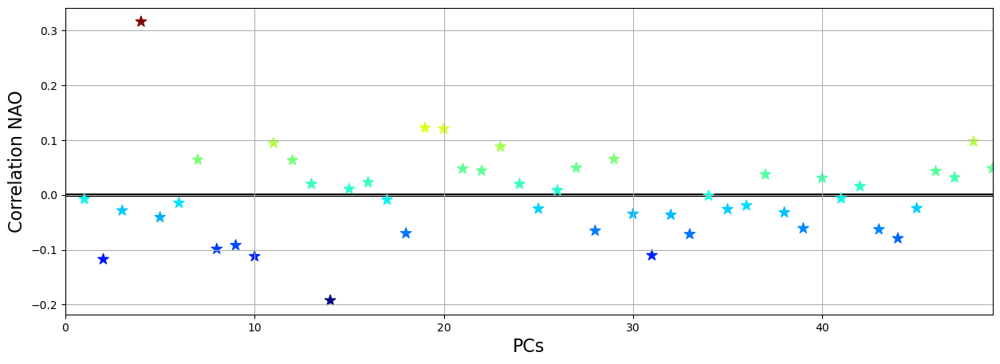

In [46]:
fig, ax = plt.subplots(1,1, figsize = [15, 5])
ax.scatter(pcs_nao.n_pcs.values+1, CORR_NAO, s=100, c = CORR_NAO, marker = '*', cmap = 'jet', label = '')
ax.plot([pcs_nao.n_pcs.values[0], pcs_nao.n_pcs.values[-1]], [0,0], color = 'black', linewidth = 3, zorder = -1)
ax.set_xlim(pcs_nao.n_pcs.values[0], pcs_nao.n_pcs.values[-1])
# ax.legend()
ax.set_xlabel('PCs', fontsize = 16)
ax.set_ylabel('Correlation NAO', fontsize = 16)
ax.grid()

In [47]:
list_colors = ['indianred', 'royalblue', 'orchid', 'mediumaquamarine', 'gold', 'plum', '#FF5733', '#33FF57', '#3366FF', '#FF33BB', '#FFD700', '#4B0082', '#00FFD1', '#FF6347', '#8A2BE2', '#FFA500']

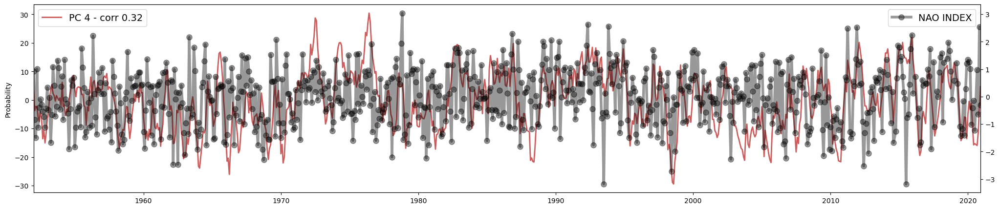

In [48]:
fig, ax = plt.subplots(1, 1, figsize = [25, 5])

pcs_sel_list = np.where(CORR_NAO>.2)[0]

for ipc, pc_sel in enumerate(pcs_sel_list):

    ax.plot(pcs_nao.time.values, pcs_nao.PCs.isel(n_pcs = pc_sel).values, label = 'PC {0} - corr {1}'.format(pc_sel+1, np.round(CORR_NAO[pc_sel],2)), 
               linewidth = 2, color = list_colors[ipc])
    ax.set_xlim(pcs_nao.time.values[0], pcs_nao.time.values[-1])
        
ax.legend(fontsize = 14, ncol = 3, loc=2)
ax.set_ylabel('Probability')


ax1 = ax.twinx()
ax1.plot(pcs_nao.time.values, pcs_nao.nao.values, '.-', color = 'black', markersize = 16, linewidth = 4, alpha = .4, label = 'NAO INDEX')
ax1.legend(fontsize = 14, loc=1)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


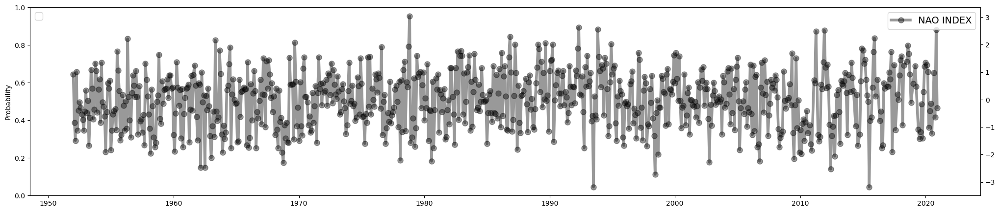

In [49]:
fig, ax = plt.subplots(1, 1, figsize = [25, 5])

pcs_sel_list = np.where(CORR_NAO<-.2)[0]

for ipc, pc_sel in enumerate(pcs_sel_list):

    ax.plot(pcs_nao.time.values, pcs_nao.PCs.isel(n_pcs = pc_sel).values, label = 'PC {0} - corr {1}'.format(pc_sel+1, np.round(CORR_NAO[pc_sel],2)), 
               linewidth = 2, color = list_colors[ipc])
    ax.set_xlim(pcs_nao.time.values[0], pcs_nao.time.values[-1])
        
ax.legend(fontsize = 14, ncol = 3, loc=2)
ax.set_ylabel('Probability')


ax1 = ax.twinx()
ax1.plot(pcs_nao.time.values, pcs_nao.nao.values, '.-', color = 'black', markersize = 16, linewidth = 4, alpha = .4, label = 'NAO INDEX')
ax1.legend(fontsize = 14, loc=1)

## AO

In [50]:
ao_p=np.loadtxt(op.join(p_index, 'ao.txt'),skiprows=2,usecols=np.arange(0,13))
ao=ao_format(ao_p, rolling_mean=0, rol_months=1)


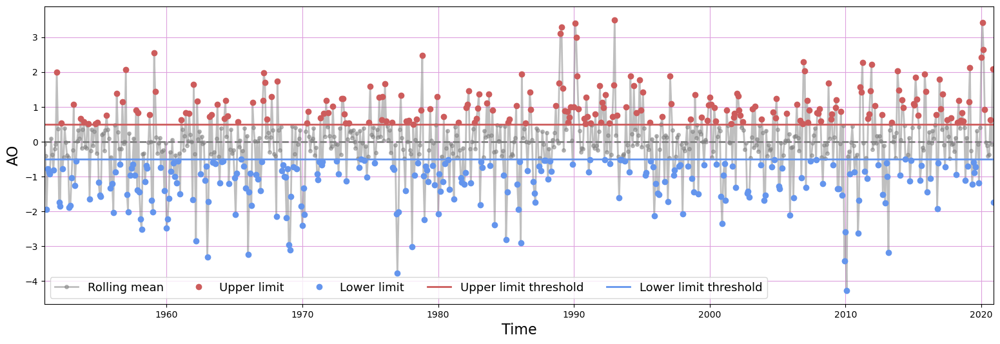

In [51]:
thr1=.5
thr2=-.5
ao = plot_index(ao, name='AO', l1=thr1, l2=thr2, figsize=[19,6])

In [52]:
u = np.intersect1d(pcs.time.values, ao.time.values)
pcs_ao = pcs.sel(time = u)
pcs_ao['ao'] = (('time'), ao.sel(time = u).index.values)

In [53]:
# fig, ax = plt.subplots(1,1, figsize = [15, 5])
CORR_AO = []
for i in pcs_ao.n_pcs.values:
    
    CORR_AO.append((np.corrcoef(pcs_ao.PCs.isel(n_pcs = i).values, pcs_ao.ao.values)[0,1]))
CORR_AO = np.array(CORR_AO)  

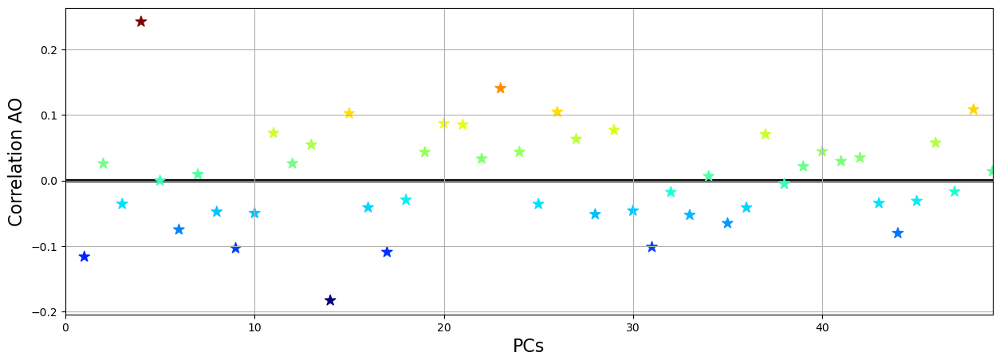

In [54]:
fig, ax = plt.subplots(1,1, figsize = [15, 5])
ax.scatter(pcs_ao.n_pcs.values+1, CORR_AO, s=100, c = CORR_AO, marker = '*', cmap = 'jet', label = '')
ax.plot([pcs_ao.n_pcs.values[0], pcs_ao.n_pcs.values[-1]], [0,0], color = 'black', linewidth = 3, zorder = -1)
ax.set_xlim(pcs_ao.n_pcs.values[0], pcs_ao.n_pcs.values[-1])
# ax.legend()
ax.set_xlabel('PCs', fontsize = 16)
ax.set_ylabel('Correlation AO', fontsize = 16)
ax.grid()

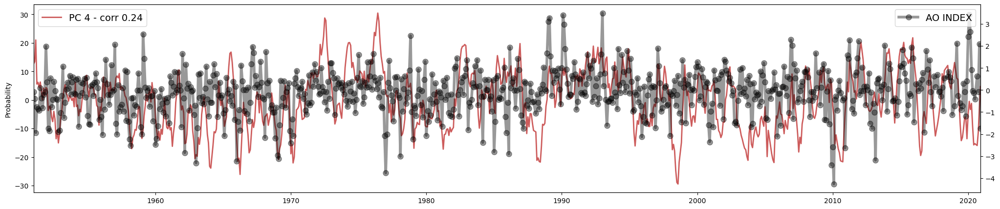

In [55]:
fig, ax = plt.subplots(1, 1, figsize = [25, 5])

pcs_sel_list = np.where(CORR_AO>.2)[0]

for ipc, pc_sel in enumerate(pcs_sel_list):

    ax.plot(pcs_ao.time.values, pcs_ao.PCs.isel(n_pcs = pc_sel).values, label = 'PC {0} - corr {1}'.format(pc_sel+1, np.round(CORR_AO[pc_sel],2)), 
               linewidth = 2, color = list_colors[ipc])
    ax.set_xlim(pcs_ao.time.values[0], pcs_ao.time.values[-1])
        
ax.legend(fontsize = 14, ncol = 3, loc=2)
ax.set_ylabel('Probability')


ax1 = ax.twinx()
ax1.plot(pcs_ao.time.values, pcs_ao.ao.values,  '.-', color = 'black', markersize = 16, linewidth = 4, alpha = .4, label = 'AO INDEX')
ax1.legend(fontsize = 14, loc=1)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


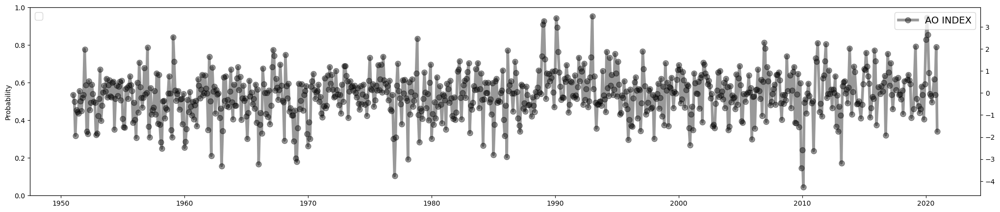

In [56]:
fig, ax = plt.subplots(1, 1, figsize = [25, 5])

pcs_sel_list = np.where(CORR_AO<-.2)[0]

for ipc, pc_sel in enumerate(pcs_sel_list):

    ax.plot(pcs_ao.time.values, pcs_ao.PCs.isel(n_pcs = pc_sel).values, label = 'PC {0} - corr {1}'.format(pc_sel+1, np.round(CORR_AO[pc_sel],2)), 
               linewidth = 2, color = list_colors[ipc])
    ax.set_xlim(pcs_ao.time.values[0], pcs_ao.time.values[-1])
        
ax.legend(fontsize = 14, ncol = 3, loc=2)
ax.set_ylabel('Probability')


ax1 = ax.twinx()
ax1.plot(pcs_ao.time.values, pcs_ao.ao.values,  '.-', color = 'black', markersize = 16, linewidth = 4, alpha = .4, label = 'AO INDEX')
ax1.legend(fontsize = 14, loc=1)

## AMO

In [57]:
amo_p=np.loadtxt(op.join(p_index, 'amo.txt'),skiprows=1,usecols=np.arange(0,13))
amo = amo_format(amo_p, rolling_mean=0, rol_months=1)


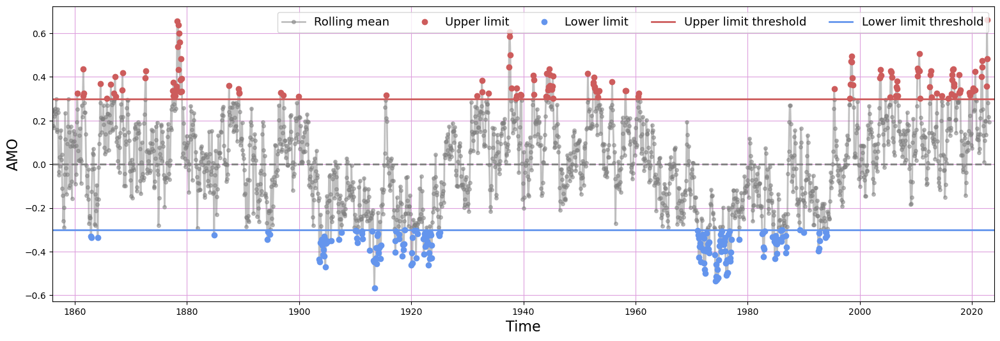

In [58]:
thr1=.3
thr2=-.3
amo = plot_index(amo, name='AMO', l1=thr1, l2=thr2, figsize=[19,6])

In [59]:
u = np.intersect1d(pcs.time.values, amo.time.values)
pcs_amo = pcs.sel(time = u)
pcs_amo['amo'] = (('time'), amo.sel(time = u).index.values)
pcs_amo = pcs_amo.dropna(dim = 'time')

In [60]:
# fig, ax = plt.subplots(1,1, figsize = [15, 5])
CORR_AMO = []
for i in pcs_amo.n_pcs.values:
    
    CORR_AMO.append((np.corrcoef(pcs_amo.PCs.isel(n_pcs = i).values, pcs_amo.amo.values)[0,1]))
CORR_AMO = np.array(CORR_AMO)  

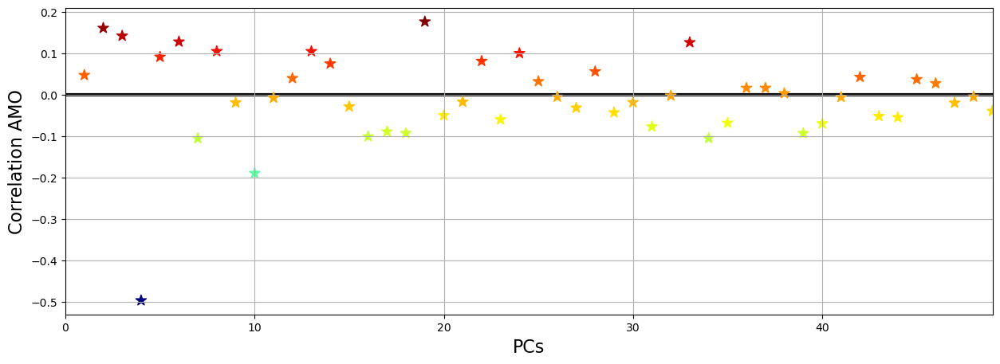

In [61]:
fig, ax = plt.subplots(1,1, figsize = [15, 5])
ax.scatter(pcs_amo.n_pcs.values+1, CORR_AMO, s=100, c = CORR_AMO, marker = '*', cmap = 'jet', label = '')
ax.plot([pcs_amo.n_pcs.values[0], pcs_amo.n_pcs.values[-1]], [0,0], color = 'black', linewidth = 3, zorder = -1)
ax.set_xlim(pcs_amo.n_pcs.values[0], pcs_amo.n_pcs.values[-1])
# ax.legend()
ax.set_xlabel('PCs', fontsize = 16)
ax.set_ylabel('Correlation AMO', fontsize = 16)
ax.grid()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


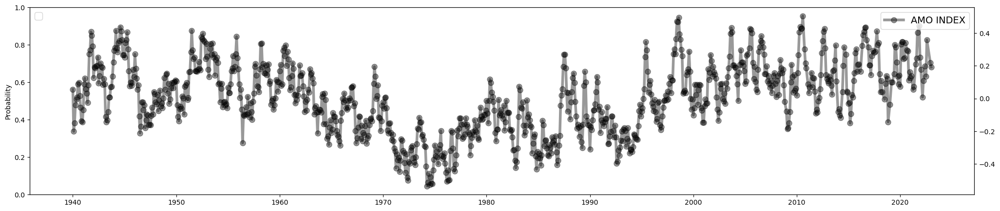

In [62]:
fig, ax = plt.subplots(1, 1, figsize = [25, 5])

pcs_sel_list = np.where(CORR_AMO>.3)[0]

for ipc, pc_sel in enumerate(pcs_sel_list):

    ax.plot(pcs_amo.time.values, pcs_amo.PCs.isel(n_pcs = pc_sel).values, label = 'PC {0} - corr {1}'.format(pc_sel+1, np.round(CORR_AMO[pc_sel],2)), 
               linewidth = 2, color = list_colors[ipc])
    ax.set_xlim(pcs_amo.time.values[0], pcs_amo.time.values[-1])
        
ax.legend(fontsize = 14, ncol = 3, loc=2)
ax.set_ylabel('Probability')


ax1 = ax.twinx()
ax1.plot(pcs_amo.time.values, pcs_amo.amo.values,  '.-', color = 'black', markersize = 16, linewidth = 4, alpha = .4, label = 'AMO INDEX')
ax1.legend(fontsize = 14, loc=1)

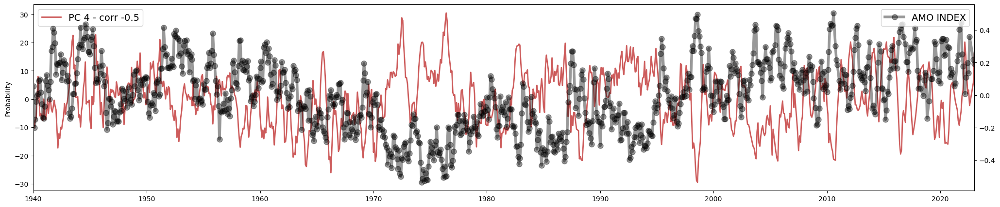

In [63]:
fig, ax = plt.subplots(1, 1, figsize = [25, 5])

pcs_sel_list = np.where(CORR_AMO<-.2)[0]

for ipc, pc_sel in enumerate(pcs_sel_list):

    ax.plot(pcs_amo.time.values, pcs_amo.PCs.isel(n_pcs = pc_sel).values, label = 'PC {0} - corr {1}'.format(pc_sel+1, np.round(CORR_AMO[pc_sel],2)), 
               linewidth = 2, color = list_colors[ipc])
    ax.set_xlim(pcs_amo.time.values[0], pcs_amo.time.values[-1])
        
ax.legend(fontsize = 14, ncol = 3, loc=2)
ax.set_ylabel('Probability')


ax1 = ax.twinx()
ax1.plot(pcs_amo.time.values, pcs_amo.amo.values,  '.-', color = 'black', markersize = 16, linewidth = 4, alpha = .4, label = 'AMO INDEX')
ax1.legend(fontsize = 14, loc=1)

## SCAND

In [64]:
scand_p=np.loadtxt(op.join(p_index, 'scand.txt'),skiprows=9)
scand = scand_format(scand_p, rolling_mean=0, rol_months=1)


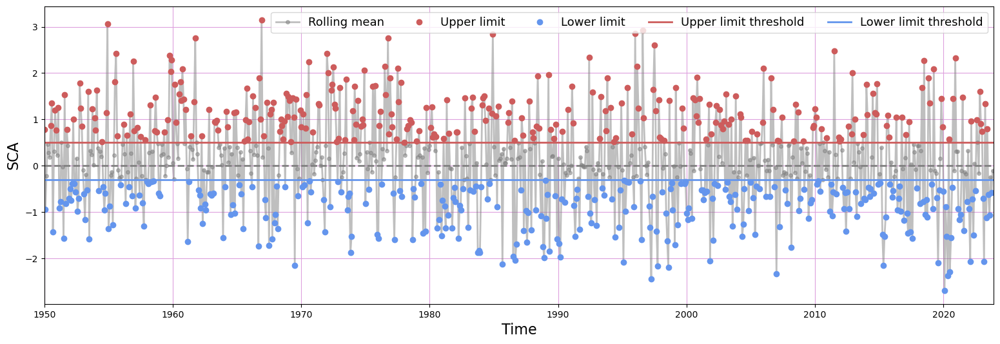

In [65]:
thr1=.5
thr2=-.3
scand = plot_index(scand, name='SCA', l1=thr1, l2=thr2, figsize=[19,6])

In [66]:
u = np.intersect1d(pcs.time.values, scand.time.values)
pcs_scand = pcs.sel(time = u)
pcs_scand['scand'] = (('time'), scand.sel(time = u).index.values)
pcs_scand = pcs_scand.dropna(dim = 'time')

In [67]:
# fig, ax = plt.subplots(1,1, figsize = [15, 5])
CORR_SCA = []
for i in pcs_scand.n_pcs.values:
    
    CORR_SCA.append((np.corrcoef(pcs_scand.PCs.isel(n_pcs = i).values, pcs_scand.scand.values)[0,1]))
CORR_SCA = np.array(CORR_SCA)  

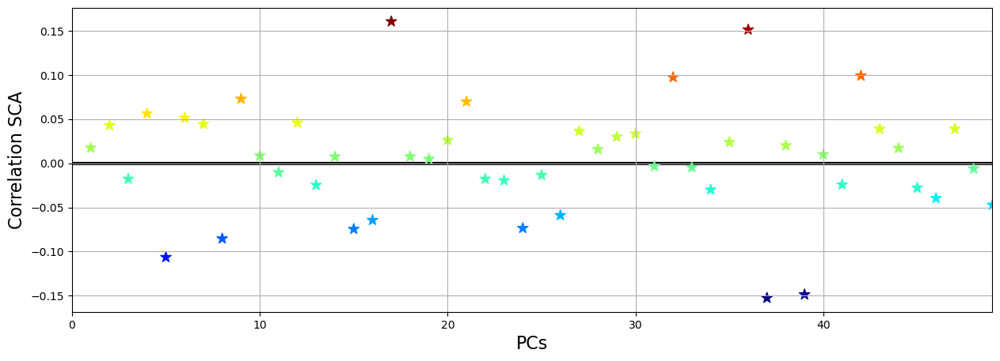

In [68]:
fig, ax = plt.subplots(1,1, figsize = [15, 5])
ax.scatter(pcs_scand.n_pcs.values+1, CORR_SCA, s=100, c = CORR_SCA, marker = '*', cmap = 'jet', label = '')
ax.plot([pcs_scand.n_pcs.values[0], pcs_scand.n_pcs.values[-1]], [0,0], color = 'black', linewidth = 3, zorder = -1)
ax.set_xlim(pcs_scand.n_pcs.values[0], pcs_scand.n_pcs.values[-1])
# ax.legend()
ax.set_xlabel('PCs', fontsize = 16)
ax.set_ylabel('Correlation SCA', fontsize = 16)
ax.grid()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


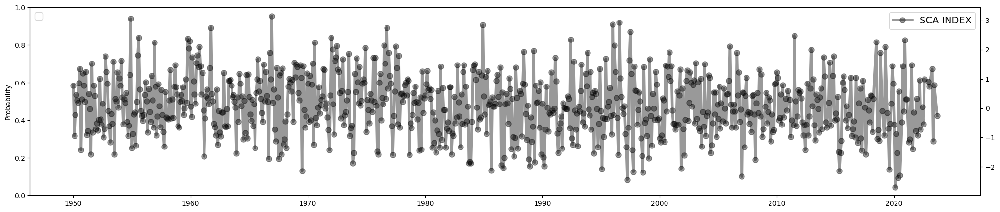

In [69]:
fig, ax = plt.subplots(1, 1, figsize = [25, 5])

pcs_sel_list = np.where(CORR_SCA>.25)[0]

for ipc, pc_sel in enumerate(pcs_sel_list):

    ax.plot(pcs_scand.time.values, pcs_scand.PCs.isel(n_pcs = pc_sel).values, label = 'PC {0} - corr {1}'.format(pc_sel+1, np.round(CORR_SCA[pc_sel],2)), 
               linewidth = 2, color = list_colors[ipc])
    ax.set_xlim(pcs_scand.time.values[0], pcs_scand.time.values[-1])
        
ax.legend(fontsize = 14, ncol = 5, loc=2)
ax.set_ylabel('Probability')


ax1 = ax.twinx()
ax1.plot(pcs_scand.time.values, pcs_scand.scand.values,  '.-', color = 'black', markersize = 16, linewidth = 4, alpha = .4, label = 'SCA INDEX')
ax1.legend(fontsize = 14, loc=1)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


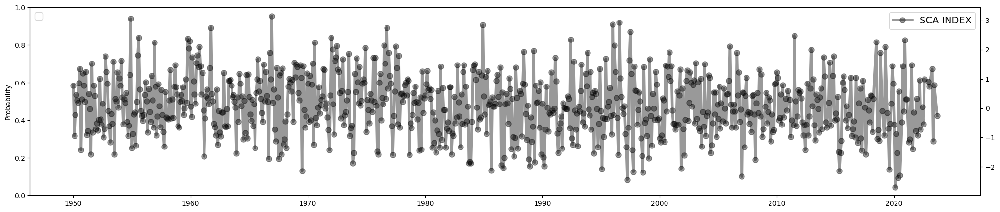

In [70]:
fig, ax = plt.subplots(1, 1, figsize = [25, 5])

pcs_sel_list = np.where(CORR_SCA<-.2)[0]

for ipc, pc_sel in enumerate(pcs_sel_list):

    ax.plot(pcs_scand.time.values, pcs_scand.PCs.isel(n_pcs = pc_sel).values, label = 'PC {0} - corr {1}'.format(pc_sel+1, np.round(CORR_SCA[pc_sel],2)), 
               linewidth = 2, color = list_colors[ipc])
    ax.set_xlim(pcs_scand.time.values[0], pcs_scand.time.values[-1])
        
ax.legend(fontsize = 14, ncol = 3, loc=2)
ax.set_ylabel('Probability')


ax1 = ax.twinx()
ax1.plot(pcs_scand.time.values, pcs_scand.scand.values,  '.-', color = 'black', markersize = 16, linewidth = 4, alpha = .4, label = 'SCA INDEX')
ax1.legend(fontsize = 14, loc=1)

## NIÑO 3.4

In [71]:
from codes import n34_format

In [72]:
n34=np.loadtxt(op.join(p_index, 'ninho34.txt'),skiprows=1, max_rows=74)
n34=n34_format(n34, rolling_mean=1)


In [73]:

time_index = pd.to_datetime(n34['time'].values)
time_index = time_index.map(lambda t: t.replace(day=1))
n34['time'] = time_index

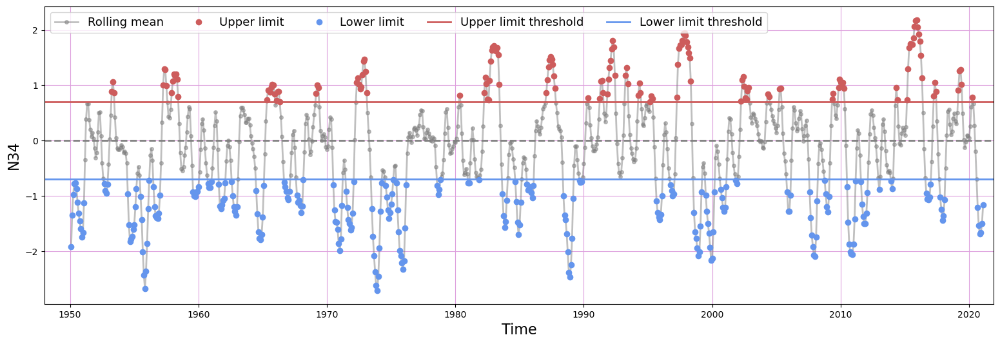

In [74]:
thr1=.7
thr2=-.7
n34 = plot_index(n34, name='N34', l1=thr1, l2=thr2, figsize=[19,6])

In [75]:
u = np.intersect1d(pcs.time.values, n34.time.values)
pcs_n34 = pcs.sel(time = u)
pcs_n34['n34'] = (('time'), n34.sel(time = u).index.values)
pcs_n34 = pcs_n34.dropna(dim = 'time')


In [76]:
# fig, ax = plt.subplots(1,1, figsize = [15, 5])
CORR_n34 = []
for i in pcs_n34.n_pcs.values:
    
    CORR_n34.append((np.corrcoef(pcs_n34.PCs.isel(n_pcs = i).values, pcs_n34.n34.values)[0,1]))
CORR_n34 = np.array(CORR_n34)  

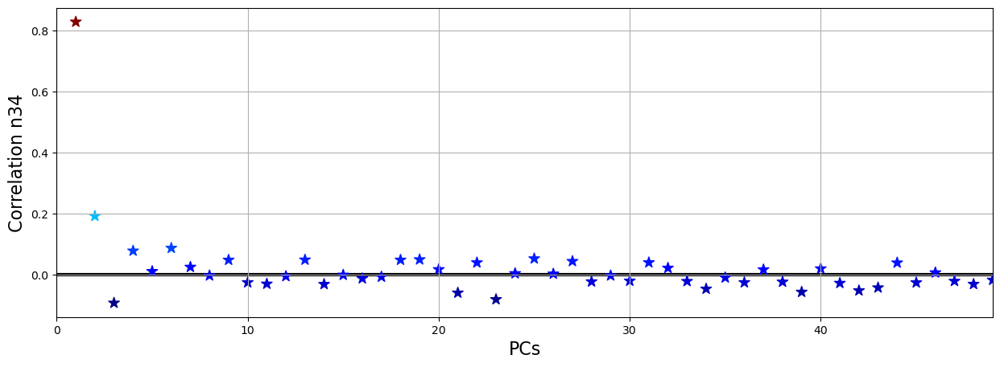

In [77]:
fig, ax = plt.subplots(1,1, figsize = [15, 5])
ax.scatter(pcs_n34.n_pcs.values+1, CORR_n34, s=100, c = CORR_n34, marker = '*', cmap = 'jet', label = '')
ax.plot([pcs_n34.n_pcs.values[0], pcs_n34.n_pcs.values[-1]], [0,0], color = 'black', linewidth = 3, zorder = -1)
ax.set_xlim(pcs_n34.n_pcs.values[0], pcs_n34.n_pcs.values[-1])
# ax.legend()
ax.set_xlabel('PCs', fontsize = 16)
ax.set_ylabel('Correlation n34', fontsize = 16)
ax.grid()

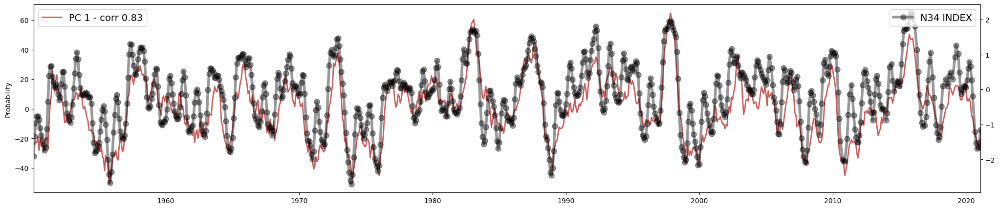

In [78]:
fig, ax = plt.subplots(1, 1, figsize = [25, 5])

pcs_sel_list = np.where(CORR_n34>.2)[0]

for ipc, pc_sel in enumerate(pcs_sel_list):

    ax.plot(pcs_n34.time.values, pcs_n34.PCs.isel(n_pcs = pc_sel).values, label = 'PC {0} - corr {1}'.format(pc_sel+1, np.round(CORR_n34[pc_sel],2)), 
               linewidth = 2, color = list_colors[ipc])
    ax.set_xlim(pcs_n34.time.values[0], pcs_n34.time.values[-1])
        
ax.legend(fontsize = 14, ncol = 5, loc=2)
ax.set_ylabel('Probability')


ax1 = ax.twinx()
ax1.plot(pcs_n34.time.values, pcs_n34.n34.values,  '.-', color = 'black', markersize = 16, linewidth = 4, alpha = .4, label = 'N34 INDEX')
ax1.legend(fontsize = 14, loc=1)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


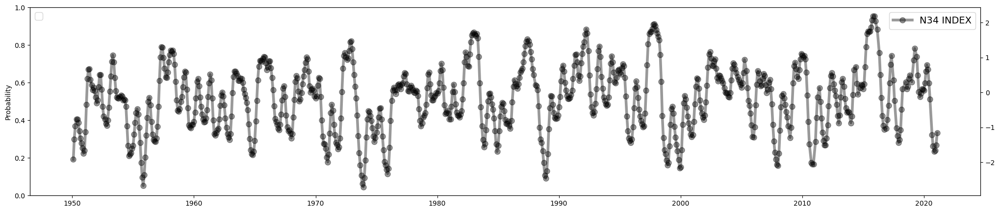

In [79]:
fig, ax = plt.subplots(1, 1, figsize = [25, 5])

pcs_sel_list = np.where(CORR_n34<-.21)[0]

for ipc, pc_sel in enumerate(pcs_sel_list):

    ax.plot(pcs_n34.time.values, pcs_n34.PCs.isel(n_pcs = pc_sel).values, label = 'PC {0} - corr {1}'.format(pc_sel+1, np.round(CORR_n34[pc_sel],2)), 
               linewidth = 2, color = list_colors[ipc])
    ax.set_xlim(pcs_n34.time.values[0], pcs_n34.time.values[-1])
        
ax.legend(fontsize = 14, ncol = 3, loc=2)
ax.set_ylabel('Probability')


ax1 = ax.twinx()
ax1.plot(pcs_n34.time.values, pcs_n34.n34.values,  '.-', color = 'black', markersize = 16, linewidth = 4, alpha = .4, label = 'N34 INDEX')
ax1.legend(fontsize = 14, loc=1)

## OLR

In [80]:
from codes import olr_format

In [81]:
olr_p=np.loadtxt(op.join(p_index, 'olr.txt'),skiprows=5,usecols=np.arange(0,13))
olr=olr_format(olr_p, rolling_mean=1, rol_months=1)


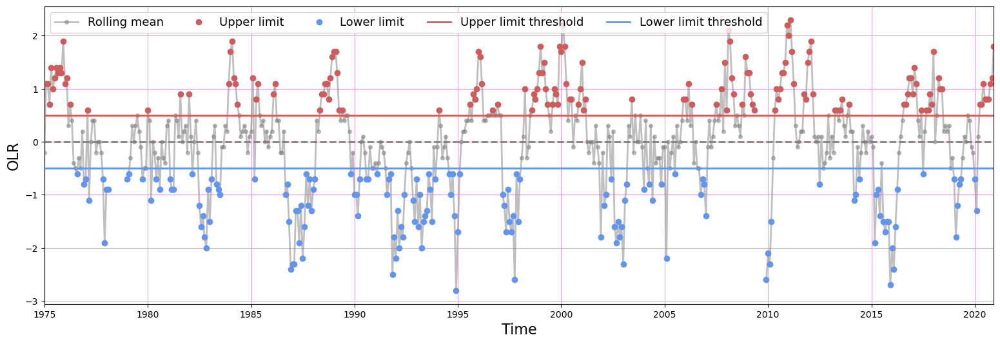

In [82]:
thr1=.5
thr2=-.5
olr = plot_index(olr, name='OLR', l1=thr1, l2=thr2, figsize=[19,6])

In [83]:
olr = olr.dropna(dim = 'time')

In [84]:
u = np.intersect1d(pcs.time.values, olr.time.values)
pcs_olr = pcs.sel(time = u)
pcs_olr['olr'] = (('time'), olr.sel(time = u).index.values)

In [85]:
# fig, ax = plt.subplots(1,1, figsize = [15, 5])
CORR_olr = []
for i in pcs_olr.n_pcs.values:
    
    CORR_olr.append((np.corrcoef(pcs_olr.PCs.isel(n_pcs = i).values, pcs_olr.olr.values)[0,1]))
CORR_olr = np.array(CORR_olr)  

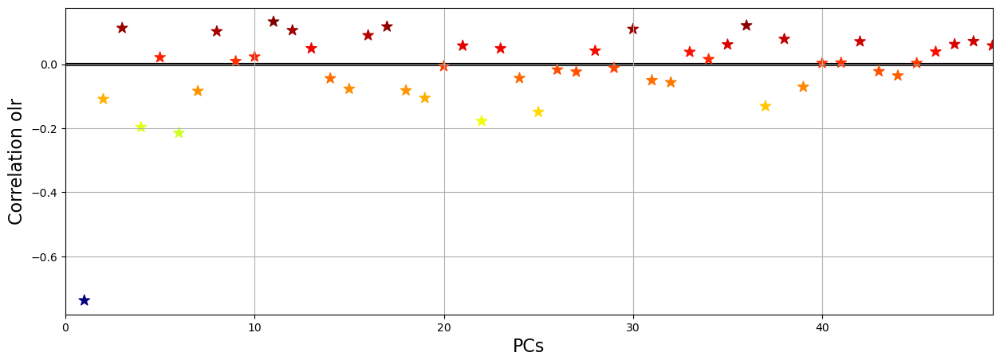

In [86]:
fig, ax = plt.subplots(1,1, figsize = [15, 5])
ax.scatter(pcs_olr.n_pcs.values+1, CORR_olr, s=100, c = CORR_olr, marker = '*', cmap = 'jet', label = '')
ax.plot([pcs_olr.n_pcs.values[0], pcs_olr.n_pcs.values[-1]], [0,0], color = 'black', linewidth = 3, zorder = -1)
ax.set_xlim(pcs_olr.n_pcs.values[0], pcs_olr.n_pcs.values[-1])
# ax.legend()
ax.set_xlabel('PCs', fontsize = 16)
ax.set_ylabel('Correlation olr', fontsize = 16)
ax.grid()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


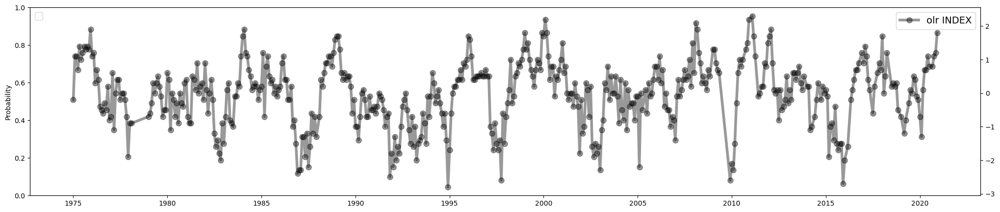

In [87]:
fig, ax = plt.subplots(1, 1, figsize = [25, 5])

pcs_sel_list = np.where(CORR_olr>.2)[0]

for ipc, pc_sel in enumerate(pcs_sel_list):

    ax.plot(pcs_olr.time.values, pcs_olr.PCs.isel(n_pcs = pc_sel).values, label = 'PC {0} - corr {1}'.format(pc_sel+1, np.round(CORR_olr[pc_sel],2)), 
               linewidth = 2, color = list_colors[ipc])
    ax.set_xlim(pcs_olr.time.values[0], pcs_olr.time.values[-1])
        
ax.legend(fontsize = 14, ncol = 5, loc=2)
ax.set_ylabel('Probability')


ax1 = ax.twinx()
ax1.plot(pcs_olr.time.values, pcs_olr.olr.values,  '.-', color = 'black', markersize = 16, linewidth = 4, alpha = .4, label = 'olr INDEX')
ax1.legend(fontsize = 14, loc=1)

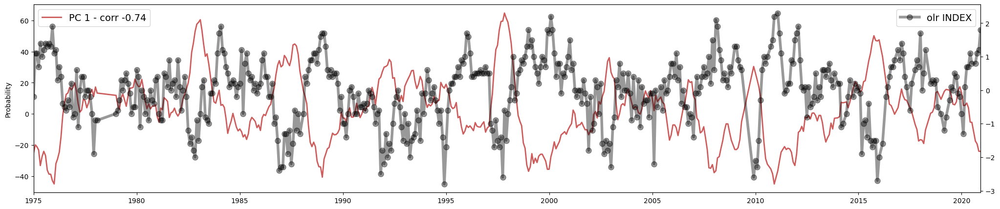

In [88]:
fig, ax = plt.subplots(1, 1, figsize = [25, 5])

pcs_sel_list = np.where(CORR_olr<-.3)[0]

for ipc, pc_sel in enumerate(pcs_sel_list):

    ax.plot(pcs_olr.time.values, pcs_olr.PCs.isel(n_pcs = pc_sel).values, label = 'PC {0} - corr {1}'.format(pc_sel+1, np.round(CORR_olr[pc_sel],2)), 
               linewidth = 2, color = list_colors[ipc])
    ax.set_xlim(pcs_olr.time.values[0], pcs_olr.time.values[-1])
        
ax.legend(fontsize = 14, ncol = 3, loc=2)
ax.set_ylabel('Probability')


ax1 = ax.twinx()
ax1.plot(pcs_olr.time.values, pcs_olr.olr.values,  '.-', color = 'black', markersize = 16, linewidth = 4, alpha = .4, label = 'olr INDEX')
ax1.legend(fontsize = 14, loc=1)

## PDO

In [89]:
from codes import pdo_format

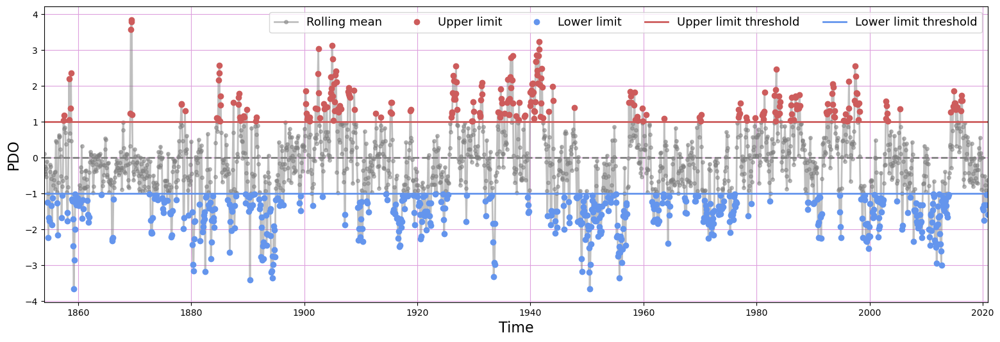

In [90]:
pdo_p=np.loadtxt(op.join(p_index, 'pdo.txt'),skiprows=2,usecols=np.arange(0,13))
pdo=pdo_format(pdo_p, rolling_mean=1, rol_months=1)
thr1=1
thr2=-1
pdo = plot_index(pdo, name='PDO', l1=thr1, l2=thr2, figsize=[19,6])


In [91]:
pdo = pdo.dropna(dim = 'time')

In [92]:
u = np.intersect1d(pcs.time.values, pdo.time.values)
pcs_pdo = pcs.sel(time = u)
pcs_pdo['pdo'] = (('time'), pdo.sel(time = u).index.values)

In [93]:
# fig, ax = plt.subplots(1,1, figsize = [15, 5])
CORR_pdo = []
for i in pcs_pdo.n_pcs.values:
    
    CORR_pdo.append((np.corrcoef(pcs_pdo.PCs.isel(n_pcs = i).values, pcs_pdo.pdo.values)[0,1]))
CORR_pdo = np.array(CORR_pdo)  

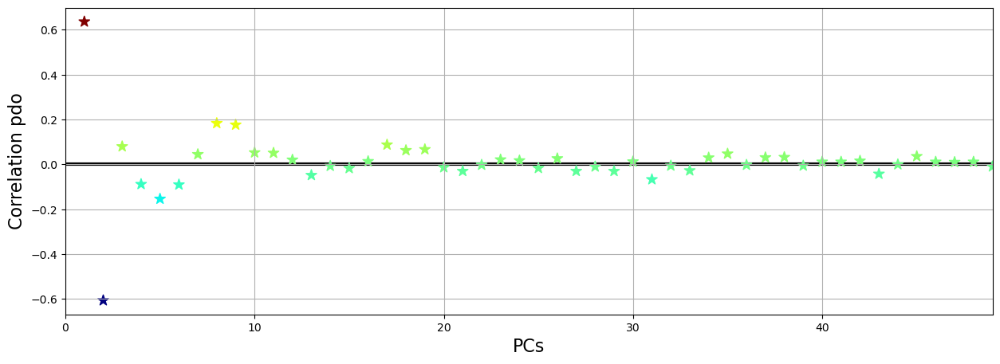

In [94]:
fig, ax = plt.subplots(1,1, figsize = [15, 5])
ax.scatter(pcs_pdo.n_pcs.values+1, CORR_pdo, s=100, c = CORR_pdo, marker = '*', cmap = 'jet', label = '')
ax.plot([pcs_pdo.n_pcs.values[0], pcs_pdo.n_pcs.values[-1]], [0,0], color = 'black', linewidth = 3, zorder = -1)
ax.set_xlim(pcs_pdo.n_pcs.values[0], pcs_pdo.n_pcs.values[-1])
# ax.legend()
ax.set_xlabel('PCs', fontsize = 16)
ax.set_ylabel('Correlation pdo', fontsize = 16)
ax.grid()

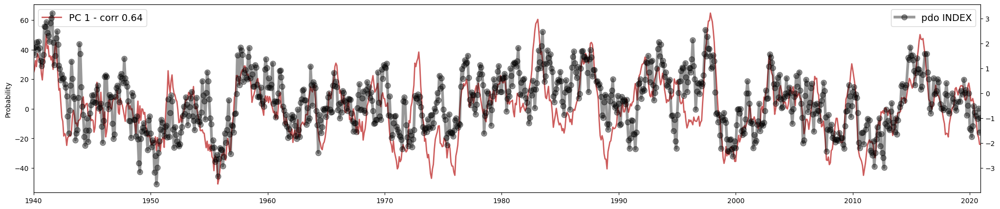

In [95]:
fig, ax = plt.subplots(1, 1, figsize = [25, 5])

pcs_sel_list = np.where(CORR_pdo>.2)[0]

for ipc, pc_sel in enumerate(pcs_sel_list):

    ax.plot(pcs_pdo.time.values, pcs_pdo.PCs.isel(n_pcs = pc_sel).values, label = 'PC {0} - corr {1}'.format(pc_sel+1, np.round(CORR_pdo[pc_sel],2)), 
               linewidth = 2, color = list_colors[ipc])
    ax.set_xlim(pcs_pdo.time.values[0], pcs_pdo.time.values[-1])
        
ax.legend(fontsize = 14, ncol = 5, loc=2)
ax.set_ylabel('Probability')


ax1 = ax.twinx()
ax1.plot(pcs_pdo.time.values, pcs_pdo.pdo.values,  '.-', color = 'black', markersize = 16, linewidth = 4, alpha = .4, label = 'pdo INDEX')
ax1.legend(fontsize = 14, loc=1)

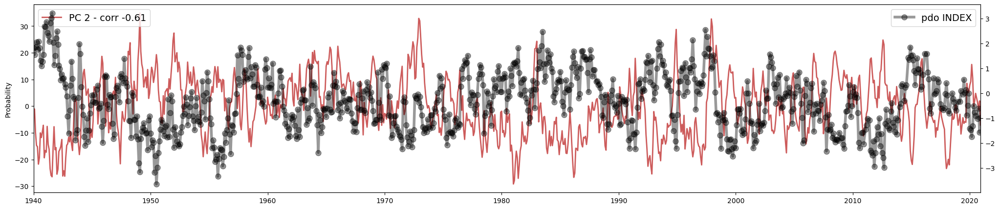

In [96]:
fig, ax = plt.subplots(1, 1, figsize = [25, 5])

pcs_sel_list = np.where(CORR_pdo<-.3)[0]

for ipc, pc_sel in enumerate(pcs_sel_list):

    ax.plot(pcs_pdo.time.values, pcs_pdo.PCs.isel(n_pcs = pc_sel).values, label = 'PC {0} - corr {1}'.format(pc_sel+1, np.round(CORR_pdo[pc_sel],2)), 
               linewidth = 2, color = list_colors[ipc])
    ax.set_xlim(pcs_pdo.time.values[0], pcs_pdo.time.values[-1])
        
ax.legend(fontsize = 14, ncol = 3, loc=2)
ax.set_ylabel('Probability')


ax1 = ax.twinx()
ax1.plot(pcs_pdo.time.values, pcs_pdo.pdo.values,  '.-', color = 'black', markersize = 16, linewidth = 4, alpha = .4, label = 'pdo INDEX')
ax1.legend(fontsize = 14, loc=1)

## SOI

In [97]:
from codes import soi_format

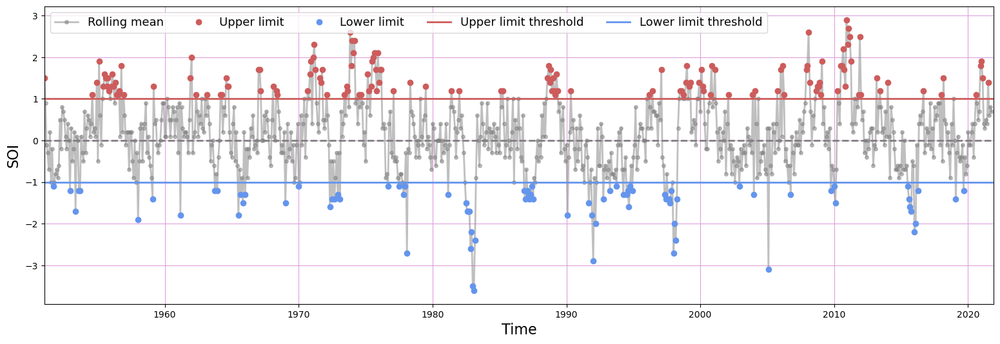

In [98]:
soi_p=np.loadtxt(op.join(p_index, 'soi.txt'),skiprows=4,usecols=np.arange(0,13))
soi=soi_format(soi_p, rolling_mean=1, rol_months=1)
thr1=1
thr2=-1
soi = plot_index(soi, name='SOI', l1=thr1, l2=thr2, figsize=[19,6])

In [99]:
soi = soi.dropna(dim = 'time')

In [100]:
u = np.intersect1d(pcs.time.values, soi.time.values)
pcs_soi = pcs.sel(time = u)
pcs_soi['soi'] = (('time'), soi.sel(time = u).index.values)

In [101]:
# fig, ax = plt.subplots(1,1, figsize = [15, 5])
CORR_soi = []
for i in pcs_soi.n_pcs.values:
    
    CORR_soi.append((np.corrcoef(pcs_soi.PCs.isel(n_pcs = i).values, pcs_soi.soi.values)[0,1]))
CORR_soi = np.array(CORR_soi)  

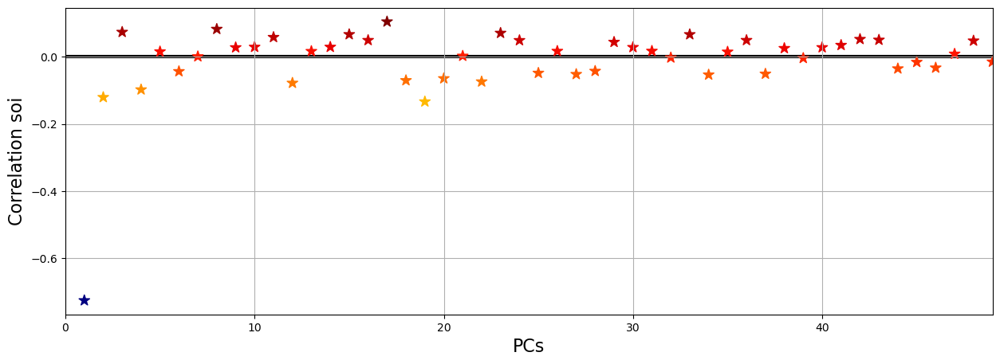

In [102]:
fig, ax = plt.subplots(1,1, figsize = [15, 5])
ax.scatter(pcs_soi.n_pcs.values+1, CORR_soi, s=100, c = CORR_soi, marker = '*', cmap = 'jet', label = '')
ax.plot([pcs_soi.n_pcs.values[0], pcs_soi.n_pcs.values[-1]], [0,0], color = 'black', linewidth = 3, zorder = -1)
ax.set_xlim(pcs_soi.n_pcs.values[0], pcs_soi.n_pcs.values[-1])
# ax.legend()
ax.set_xlabel('PCs', fontsize = 16)
ax.set_ylabel('Correlation soi', fontsize = 16)
ax.grid()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


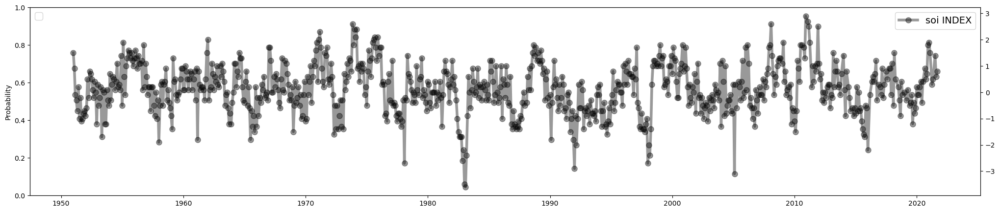

In [103]:
fig, ax = plt.subplots(1, 1, figsize = [25, 5])

pcs_sel_list = np.where(CORR_soi>.25)[0]

for ipc, pc_sel in enumerate(pcs_sel_list):

    ax.plot(pcs_soi.time.values, pcs_soi.PCs.isel(n_pcs = pc_sel).values, label = 'PC {0} - corr {1}'.format(pc_sel+1, np.round(CORR_soi[pc_sel],2)), 
               linewidth = 2, color = list_colors[ipc])
    ax.set_xlim(pcs_soi.time.values[0], pcs_soi.time.values[-1])
        
ax.legend(fontsize = 14, ncol = 5, loc=2)
ax.set_ylabel('Probability')


ax1 = ax.twinx()
ax1.plot(pcs_soi.time.values, pcs_soi.soi.values,  '.-', color = 'black', markersize = 16, linewidth = 4, alpha = .4, label = 'soi INDEX')
ax1.legend(fontsize = 14, loc=1)

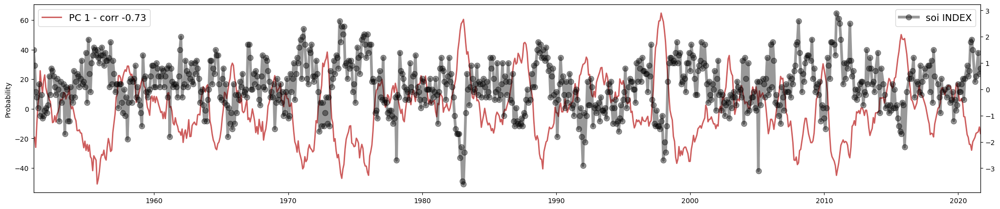

In [104]:
fig, ax = plt.subplots(1, 1, figsize = [25, 5])

pcs_sel_list = np.where(CORR_soi<-.3)[0]

for ipc, pc_sel in enumerate(pcs_sel_list):

    ax.plot(pcs_soi.time.values, pcs_soi.PCs.isel(n_pcs = pc_sel).values, label = 'PC {0} - corr {1}'.format(pc_sel+1, np.round(CORR_soi[pc_sel],2)), 
               linewidth = 2, color = list_colors[ipc])
    ax.set_xlim(pcs_soi.time.values[0], pcs_soi.time.values[-1])
        
ax.legend(fontsize = 14, ncol = 3, loc=2)
ax.set_ylabel('Probability')


ax1 = ax.twinx()
ax1.plot(pcs_soi.time.values, pcs_soi.soi.values,  '.-', color = 'black', markersize = 16, linewidth = 4, alpha = .4, label = 'soi INDEX')
ax1.legend(fontsize = 14, loc=1)

## PNA

In [105]:
from codes import pna_format

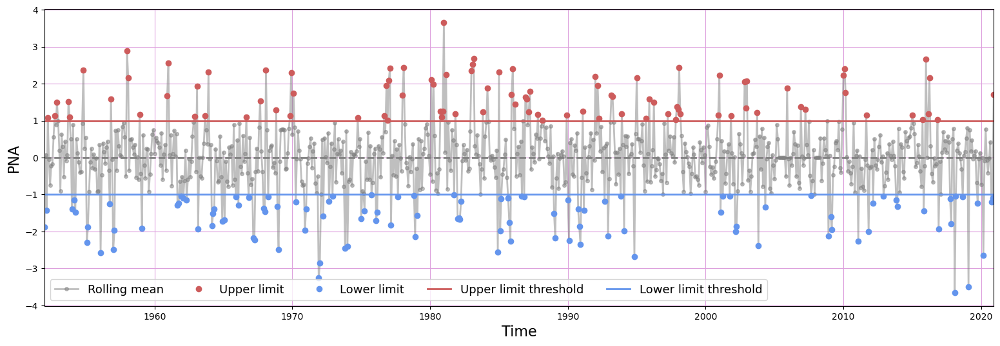

In [106]:
pna_p=np.loadtxt(op.join(p_index, 'pna.txt'),skiprows=2,usecols=np.arange(0,13))
pna=pna_format(pna_p, rolling_mean=1, rol_months=1)
thr1=1
thr2=-1
pna = plot_index(pna, name='PNA', l1=thr1, l2=thr2, figsize=[19,6])

In [107]:
pna = pna.dropna(dim = 'time')

In [108]:
u = np.intersect1d(pcs.time.values, pna.time.values)
pcs_pna = pcs.sel(time = u)
pcs_pna['pna'] = (('time'), pna.sel(time = u).index.values)

In [109]:
# fig, ax = plt.subplots(1,1, figsize = [15, 5])
CORR_pna = []
for i in pcs_pna.n_pcs.values:
    
    CORR_pna.append((np.corrcoef(pcs_pna.PCs.isel(n_pcs = i).values, pcs_pna.pna.values)[0,1]))
CORR_pna = np.array(CORR_pna)  

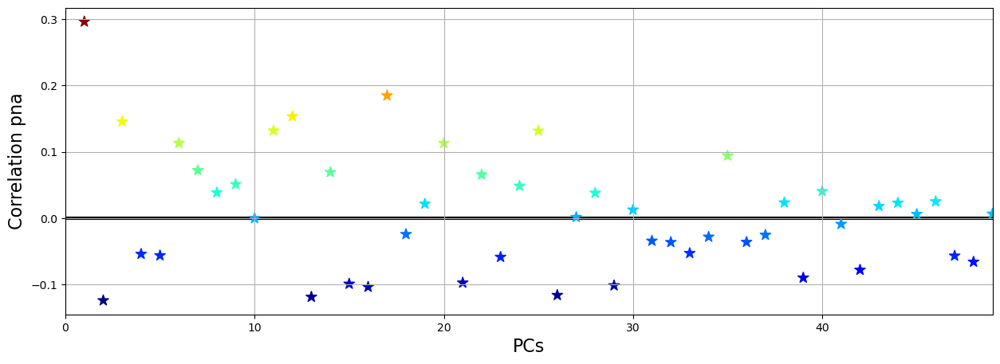

In [110]:
fig, ax = plt.subplots(1,1, figsize = [15, 5])
ax.scatter(pcs_pna.n_pcs.values+1, CORR_pna, s=100, c = CORR_pna, marker = '*', cmap = 'jet', label = '')
ax.plot([pcs_pna.n_pcs.values[0], pcs_pna.n_pcs.values[-1]], [0,0], color = 'black', linewidth = 3, zorder = -1)
ax.set_xlim(pcs_pna.n_pcs.values[0], pcs_pna.n_pcs.values[-1])
# ax.legend()
ax.set_xlabel('PCs', fontsize = 16)
ax.set_ylabel('Correlation pna', fontsize = 16)
ax.grid()

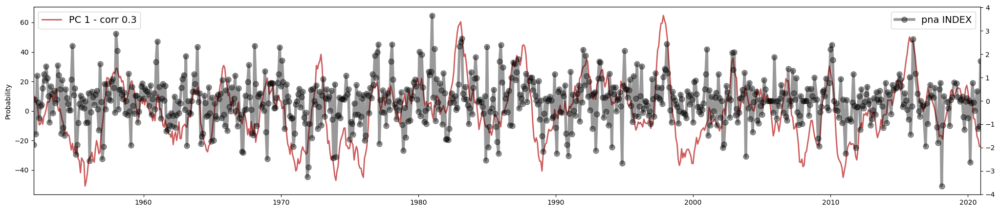

In [111]:
fig, ax = plt.subplots(1, 1, figsize = [25, 5])

pcs_sel_list = np.where(CORR_pna>.25)[0]

for ipc, pc_sel in enumerate(pcs_sel_list):

    ax.plot(pcs_pna.time.values, pcs_pna.PCs.isel(n_pcs = pc_sel).values, label = 'PC {0} - corr {1}'.format(pc_sel+1, np.round(CORR_pna[pc_sel],2)), 
               linewidth = 2, color = list_colors[ipc])
    ax.set_xlim(pcs_pna.time.values[0], pcs_pna.time.values[-1])
        
ax.legend(fontsize = 14, ncol = 5, loc=2)
ax.set_ylabel('Probability')


ax1 = ax.twinx()
ax1.plot(pcs_pna.time.values, pcs_pna.pna.values,  '.-', color = 'black', markersize = 16, linewidth = 4, alpha = .4, label = 'pna INDEX')
ax1.legend(fontsize = 14, loc=1)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


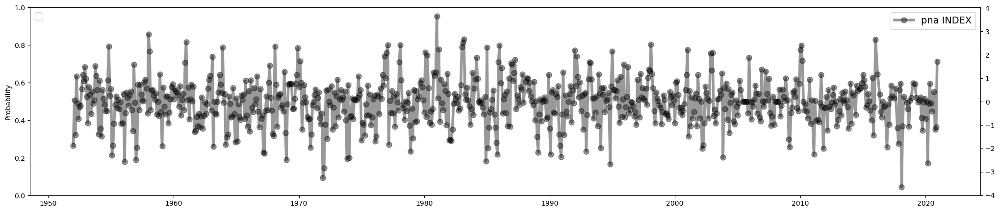

In [112]:
fig, ax = plt.subplots(1, 1, figsize = [25, 5])

pcs_sel_list = np.where(CORR_pna<-.25)[0]

for ipc, pc_sel in enumerate(pcs_sel_list):

    ax.plot(pcs_pna.time.values, pcs_pna.PCs.isel(n_pcs = pc_sel).values, label = 'PC {0} - corr {1}'.format(pc_sel+1, np.round(CORR_pna[pc_sel],2)), 
               linewidth = 2, color = list_colors[ipc])
    ax.set_xlim(pcs_pna.time.values[0], pcs_pna.time.values[-1])
        
ax.legend(fontsize = 14, ncol = 3, loc=2)
ax.set_ylabel('Probability')


ax1 = ax.twinx()
ax1.plot(pcs_pna.time.values, pcs_pna.pna.values,  '.-', color = 'black', markersize = 16, linewidth = 4, alpha = .4, label = 'pna INDEX')
ax1.legend(fontsize = 14, loc=1)

## SAM

In [113]:
from codes import sam_format

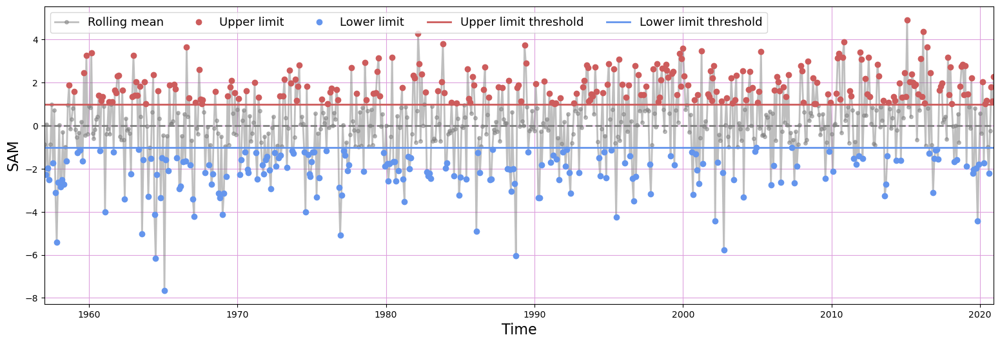

In [114]:
sam_p=np.loadtxt(op.join(p_index, 'sam.txt'),skiprows=2,usecols=np.arange(0,13))
sam=sam_format(sam_p, rolling_mean=1, rol_months=1)
thr1=1
thr2=-1
sam = plot_index(sam, name='SAM', l1=thr1, l2=thr2, figsize=[19,6])

In [115]:
sam = sam.dropna(dim = 'time')

In [116]:
u = np.intersect1d(pcs.time.values, sam.time.values)
pcs_sam = pcs.sel(time = u)
pcs_sam['sam'] = (('time'), sam.sel(time = u).index.values)

In [117]:
# fig, ax = plt.subplots(1,1, figsize = [15, 5])
CORR_sam = []
for i in pcs_sam.n_pcs.values:
    
    CORR_sam.append((np.corrcoef(pcs_sam.PCs.isel(n_pcs = i).values, pcs_sam.sam.values)[0,1]))
CORR_sam = np.array(CORR_sam)  

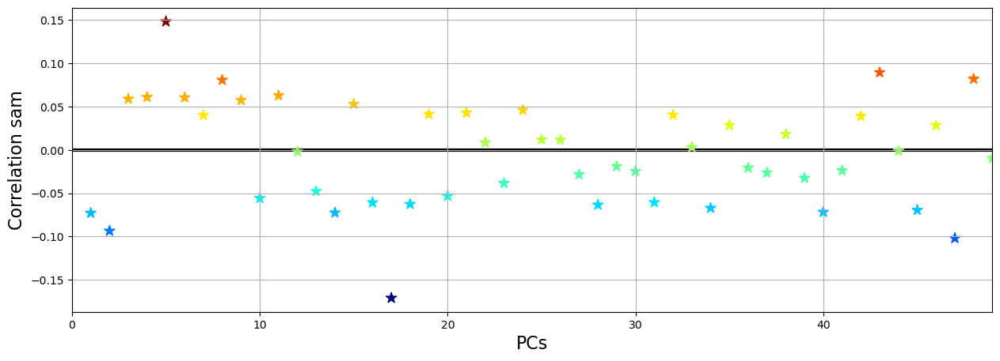

In [118]:
fig, ax = plt.subplots(1,1, figsize = [15, 5])
ax.scatter(pcs_sam.n_pcs.values+1, CORR_sam, s=100, c = CORR_sam, marker = '*', cmap = 'jet', label = '')
ax.plot([pcs_sam.n_pcs.values[0], pcs_sam.n_pcs.values[-1]], [0,0], color = 'black', linewidth = 3, zorder = -1)
ax.set_xlim(pcs_sam.n_pcs.values[0], pcs_sam.n_pcs.values[-1])
# ax.legend()
ax.set_xlabel('PCs', fontsize = 16)
ax.set_ylabel('Correlation sam', fontsize = 16)
ax.grid()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


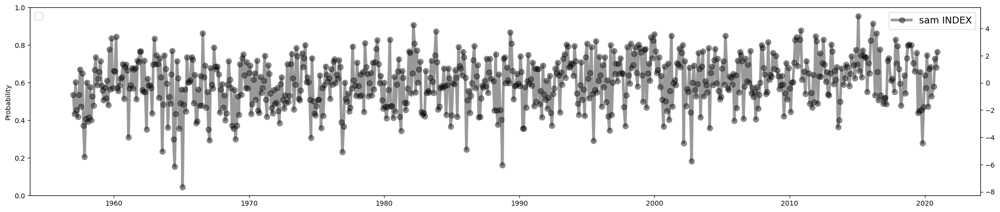

In [119]:
fig, ax = plt.subplots(1, 1, figsize = [25, 5])

pcs_sel_list = np.where(CORR_sam>.3)[0]

for ipc, pc_sel in enumerate(pcs_sel_list):

    ax.plot(pcs_sam.time.values, pcs_sam.PCs.isel(n_pcs = pc_sel).values, label = 'PC {0} - corr {1}'.format(pc_sel+1, np.round(CORR_sam[pc_sel],2)), 
               linewidth = 2, color = list_colors[ipc])
    ax.set_xlim(pcs_sam.time.values[0], pcs_sam.time.values[-1])
        
ax.legend(fontsize = 14, ncol = 5, loc=2)
ax.set_ylabel('Probability')


ax1 = ax.twinx()
ax1.plot(pcs_sam.time.values, pcs_sam.sam.values,  '.-', color = 'black', markersize = 16, linewidth = 4, alpha = .4, label = 'sam INDEX')
ax1.legend(fontsize = 14, loc=1)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


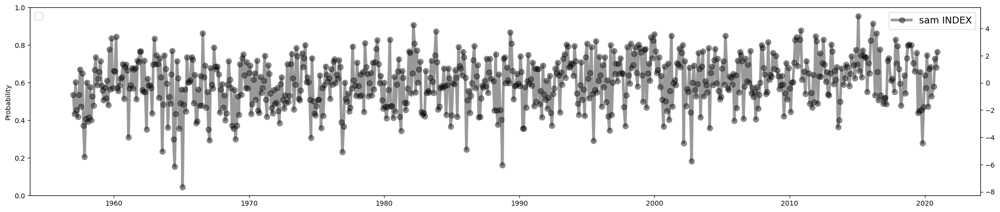

In [120]:
fig, ax = plt.subplots(1, 1, figsize = [25, 5])

pcs_sel_list = np.where(CORR_sam<-.3)[0]

for ipc, pc_sel in enumerate(pcs_sel_list):

    ax.plot(pcs_sam.time.values, pcs_sam.PCs.isel(n_pcs = pc_sel).values, label = 'PC {0} - corr {1}'.format(pc_sel+1, np.round(CORR_sam[pc_sel],2)), 
               linewidth = 2, color = list_colors[ipc])
    ax.set_xlim(pcs_sam.time.values[0], pcs_sam.time.values[-1])
        
ax.legend(fontsize = 14, ncol = 3, loc=2)
ax.set_ylabel('Probability')


ax1 = ax.twinx()
ax1.plot(pcs_sam.time.values, pcs_sam.sam.values,  '.-', color = 'black', markersize = 16, linewidth = 4, alpha = .4, label = 'sam INDEX')
ax1.legend(fontsize = 14, loc=1)

## Summary

In [121]:
vars_plot = [CORR_NAO, CORR_AO, CORR_AMO, CORR_SCA, CORR_olr, CORR_n34, CORR_pdo, CORR_soi, CORR_pna, CORR_sam]
color_index = ['violet', 'royalblue', 'purple', 'coral', 'crimson', 'darkgreen', 'navy', 'limegreen', 'darkred', 'lightseagreen']
markers = ['s', 'o', 'D', 'X', 'p', '^', '*', '<', '8', 'v']
name_var = ['NAO', 'AO', 'AMO', 'SCA', 'OLR', 'N34', 'PDO', 'SOI', 'PNA', 'SAM']

In [122]:
matrix_corr = np.vstack(vars_plot)
max_ind = np.argmax(np.abs(matrix_corr), axis = 0)

max_pos = np.argmax(matrix_corr, axis = 0)
max_neg = np.argmin(matrix_corr, axis = 0)

### Absolute

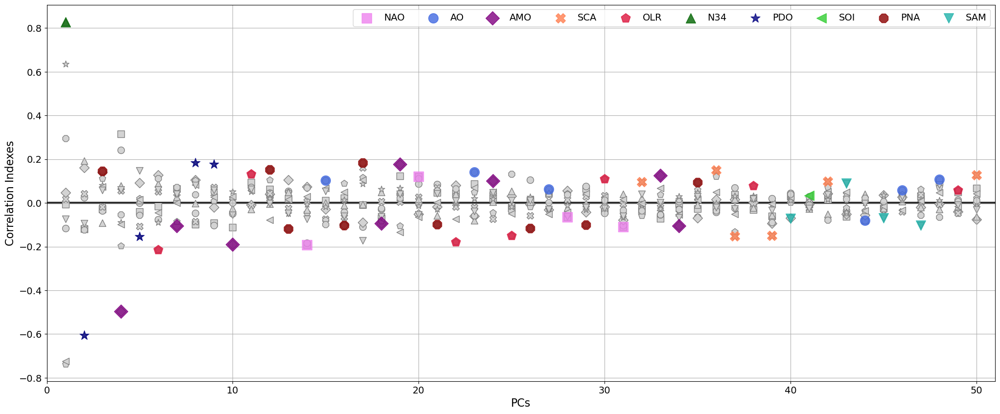

In [123]:
fig, ax = plt.subplots(1,1, figsize = [25, 10])

for iv, v in enumerate(vars_plot):
    
    ax.scatter(pcs_olr.n_pcs.values+1, v, s=100, c = 'lightgrey', marker = markers[iv], edgecolor = 'grey', cmap = 'jet')#, label = name_var[iv])
    
    imax = np.where(max_ind == iv)
    
    ax.scatter(pcs_olr.n_pcs.values[imax]+1, v[imax], s=200, c = color_index[iv], alpha = .8, edgecolor = color_index[iv], marker = markers[iv], label = name_var[iv], zorder = 3)



ax.plot([pcs_olr.n_pcs.values[0], pcs_olr.n_pcs.values[-1]+2], [0,0], color = 'black', linewidth = 3, zorder = -1)
ax.set_xlim(pcs_olr.n_pcs.values[0], pcs_olr.n_pcs.values[-1]+2)
ax.legend(ncol = len(name_var), fontsize = 14)
ax.set_xlabel('PCs', fontsize = 16)
ax.set_ylabel('Correlation Indexes', fontsize = 16)
ax.grid()
plt.tick_params(axis='both', labelsize=14)


### Positive + Negative

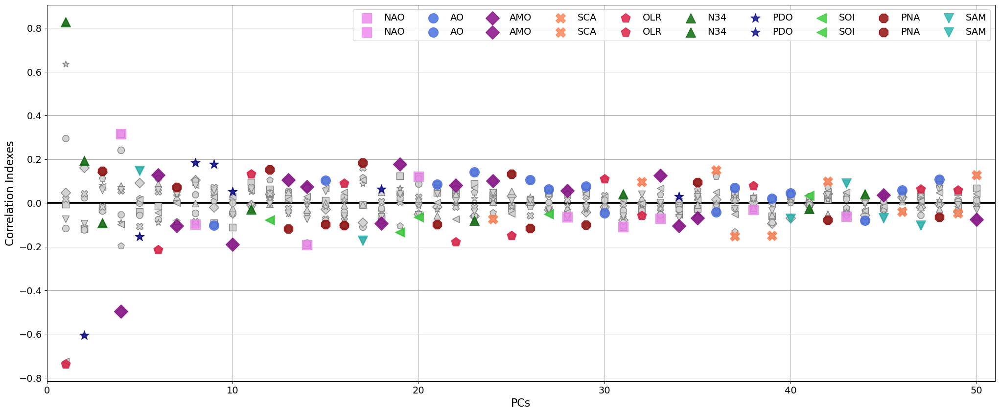

In [124]:
fig, ax = plt.subplots(1,1, figsize = [25, 10])

for iv, v in enumerate(vars_plot):
    
    ax.scatter(pcs_olr.n_pcs.values+1, v, s=100, c = 'lightgrey', marker = markers[iv], edgecolor = 'grey', cmap = 'jet')#, label = name_var[iv])
    
    imax = np.where(max_pos == iv)
    
    ax.scatter(pcs_olr.n_pcs.values[imax]+1, v[imax], s=200, c = color_index[iv], alpha = .8, edgecolor = color_index[iv], marker = markers[iv], label = name_var[iv], zorder = 3)
    
    imax = np.where(max_neg == iv)
    
    ax.scatter(pcs_olr.n_pcs.values[imax]+1, v[imax], s=200, c = color_index[iv], alpha = .8, edgecolor = color_index[iv], marker = markers[iv], label = name_var[iv], zorder = 3)



ax.plot([pcs_olr.n_pcs.values[0], pcs_olr.n_pcs.values[-1]+2], [0,0], color = 'black', linewidth = 3, zorder = -1)
ax.set_xlim(pcs_olr.n_pcs.values[0], pcs_olr.n_pcs.values[-1]+2)
ax.legend(ncol = len(name_var), fontsize = 14)
ax.set_xlabel('PCs', fontsize = 16)
ax.set_ylabel('Correlation Indexes', fontsize = 16)
ax.grid()
plt.tick_params(axis='both', labelsize=14)


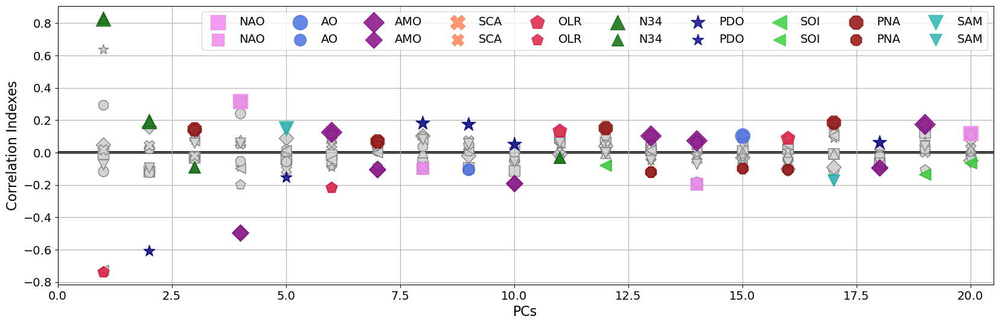

In [125]:
fig, ax = plt.subplots(1,1, figsize = [20, 6])

for iv, v in enumerate(vars_plot):
    
    ax.scatter(pcs_olr.n_pcs.values+1, v, s=150, c = 'lightgrey', marker = markers[iv], edgecolor = 'grey', cmap = 'jet')#, label = name_var[iv])
    
    imax = np.where(max_pos == iv)
    
    ax.scatter(pcs_olr.n_pcs.values[imax]+1, v[imax], s=300, c = color_index[iv], alpha = .8, edgecolor = color_index[iv], marker = markers[iv], label = name_var[iv], zorder = 3)
    
    imax = np.where(max_neg == iv)
    
    ax.scatter(pcs_olr.n_pcs.values[imax]+1, v[imax], s=200, c = color_index[iv], alpha = .8, edgecolor = color_index[iv], marker = markers[iv], label = name_var[iv], zorder = 3)




ax.plot([pcs_olr.n_pcs.values[0], pcs_olr.n_pcs.values[-1]+2], [0,0], color = 'black', linewidth = 3, zorder = -1)
ax.set_xlim(pcs_olr.n_pcs.values[0], 20.5)
ax.legend(ncol = len(name_var), fontsize = 14)
ax.set_xlabel('PCs', fontsize = 16)
ax.set_ylabel('Correlation Indexes', fontsize = 16)
ax.grid()
plt.tick_params(axis='both', labelsize=14)


### Positive

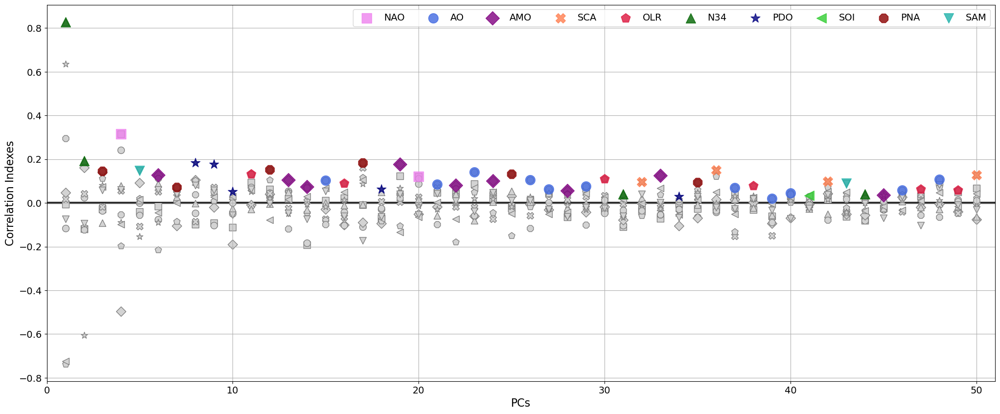

In [126]:
fig, ax = plt.subplots(1,1, figsize = [25, 10])

for iv, v in enumerate(vars_plot):
    
    ax.scatter(pcs_olr.n_pcs.values+1, v, s=100, c = 'lightgrey', marker = markers[iv], edgecolor = 'grey', cmap = 'jet')#, label = name_var[iv])
    
    imax = np.where(max_pos == iv)
    
    ax.scatter(pcs_olr.n_pcs.values[imax]+1, v[imax], s=200, c = color_index[iv], alpha = .8, edgecolor = color_index[iv], marker = markers[iv], label = name_var[iv], zorder = 3)



ax.plot([pcs_olr.n_pcs.values[0], pcs_olr.n_pcs.values[-1]+2], [0,0], color = 'black', linewidth = 3, zorder = -1)
ax.set_xlim(pcs_olr.n_pcs.values[0], pcs_olr.n_pcs.values[-1]+2)
ax.legend(ncol = len(name_var), fontsize = 14)
ax.set_xlabel('PCs', fontsize = 16)
ax.set_ylabel('Correlation Indexes', fontsize = 16)
ax.grid()
plt.tick_params(axis='both', labelsize=14)


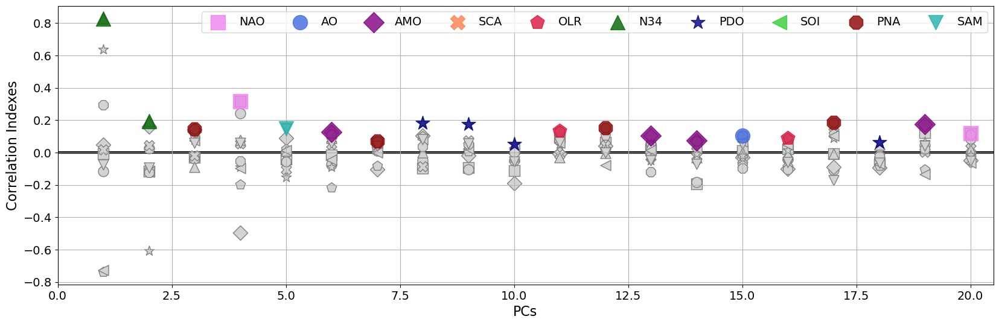

In [127]:
fig, ax = plt.subplots(1,1, figsize = [20, 6])

for iv, v in enumerate(vars_plot):
    
    ax.scatter(pcs_olr.n_pcs.values+1, v, s=150, c = 'lightgrey', marker = markers[iv], edgecolor = 'grey', cmap = 'jet')#, label = name_var[iv])
    
    imax = np.where(max_pos == iv)
    
    ax.scatter(pcs_olr.n_pcs.values[imax]+1, v[imax], s=300, c = color_index[iv], alpha = .8, edgecolor = color_index[iv], marker = markers[iv], label = name_var[iv], zorder = 3)



ax.plot([pcs_olr.n_pcs.values[0], pcs_olr.n_pcs.values[-1]+2], [0,0], color = 'black', linewidth = 3, zorder = -1)
ax.set_xlim(pcs_olr.n_pcs.values[0], 20.5)
ax.legend(ncol = len(name_var), fontsize = 14)
ax.set_xlabel('PCs', fontsize = 16)
ax.set_ylabel('Correlation Indexes', fontsize = 16)
ax.grid()
plt.tick_params(axis='both', labelsize=14)


### Negative

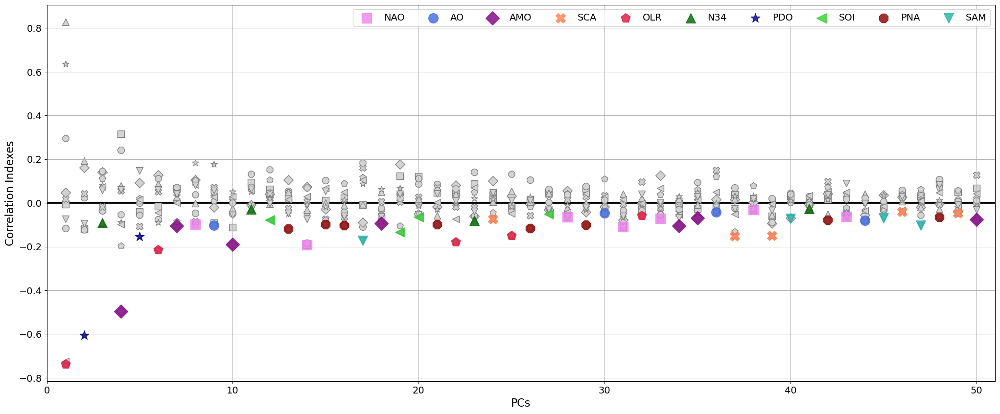

In [128]:
fig, ax = plt.subplots(1,1, figsize = [25, 10])

for iv, v in enumerate(vars_plot):
    
    ax.scatter(pcs_olr.n_pcs.values+1, v, s=100, c = 'lightgrey', marker = markers[iv], edgecolor = 'grey', cmap = 'jet')#, label = name_var[iv])
    
    imax = np.where(max_neg == iv)
    
    ax.scatter(pcs_olr.n_pcs.values[imax]+1, v[imax], s=200, c = color_index[iv], alpha = .8, edgecolor = color_index[iv], marker = markers[iv], label = name_var[iv], zorder = 3)



ax.plot([pcs_olr.n_pcs.values[0], pcs_olr.n_pcs.values[-1]+2], [0,0], color = 'black', linewidth = 3, zorder = -1)
ax.set_xlim(pcs_olr.n_pcs.values[0], pcs_olr.n_pcs.values[-1]+2)
ax.legend(ncol = len(name_var), fontsize = 14)
ax.set_xlabel('PCs', fontsize = 16)
ax.set_ylabel('Correlation Indexes', fontsize = 16)
ax.grid()
plt.tick_params(axis='both', labelsize=14)


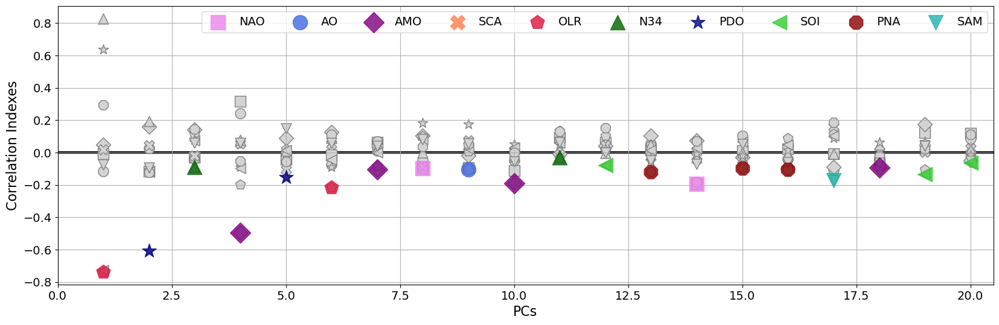

In [129]:
fig, ax = plt.subplots(1,1, figsize = [20, 6])

for iv, v in enumerate(vars_plot):
    
    ax.scatter(pcs_olr.n_pcs.values+1, v, s=150, c = 'lightgrey', marker = markers[iv], edgecolor = 'grey', cmap = 'jet')#, label = name_var[iv])
    
    imax = np.where(max_neg == iv)
    
    ax.scatter(pcs_olr.n_pcs.values[imax]+1, v[imax], s=300, c = color_index[iv], alpha = .8, edgecolor = color_index[iv], marker = markers[iv], label = name_var[iv], zorder = 3)



ax.plot([pcs_olr.n_pcs.values[0], pcs_olr.n_pcs.values[-1]+2], [0,0], color = 'black', linewidth = 3, zorder = -1)
ax.set_xlim(pcs_olr.n_pcs.values[0], 20.5)
ax.legend(ncol = len(name_var), fontsize = 14)
ax.set_xlabel('PCs', fontsize = 16)
ax.set_ylabel('Correlation Indexes', fontsize = 16)
ax.grid()
plt.tick_params(axis='both', labelsize=14)
